In [1]:
# For functionality, move out of container folder 

In [2]:
import numpy as np
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
import scipy.io 
%matplotlib inline
%load_ext autoreload
%autoreload 2

import os, glob, cv2

# packages needed for making a dataset: 
from torch.utils.data import DataLoader
from torchvision import transforms

from diffuser_utils import *
import spectral_diffusercam_utils.helper_functions as helper
import dataset as ds
import models.spectral_model as sm
import models.machinelearning_forward as fm

from datetime import date, datetime
import time

import sys
sys.path.append("..")

from models.unet import Unet
import models.unet3d as Unet3d


from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import dataset_helper_functions.read_pca_data as rpca
import csv

os.environ['CUDA_LAUNCH_BLOCKING'] = '1' 
os.environ["CUDA_DEVICE_ORDER"]= "PCI_BUS_ID"
os.environ["CUDA_VISIBLE_DEVICES"]= "3" #choose the number of gpu that's free. It goes from 0-3

device = 'cuda:0'

In [3]:
torch._C._cuda_init()

In [4]:
# pull datasets
fruitset_pca = glob.glob('../DefocusCamData/sample_data/fruitdata/pca/*.mat')
fruitset_cspace = glob.glob('../DefocusCamData/sample_data/fruitdata/cspaces/*.mat')
apple = glob.glob('../DefocusCamData/sample_data/fruit/*.mat')
all_files_summer = glob.glob('/home/kyanny_waller/summerResearch/CZ_hsdb/*.mat')
paviaU = glob.glob('../DefocusCamData/sample_data/PaviaU.mat')


In [5]:
### load pavia image
pavia_test_data = ds.SpectralDataset(paviaU, transforms.Compose([ds.subImageRand(),
                                                                   ds.chooseSpectralBands(), 
                                                                   ds.Normalize(), 
                                                                   ds.toTensor()]), tag = 'paviaU')
#load fruit pca data
fruit_train_data = ds.SpectralDataset(fruitset_pca, transforms.Compose([ds.readCompressed(),
                                                                       ds.Resize(),
                                                                       ds.chooseSpectralBands(),
                                                                       ds.RandFlip(), 
                                                                       ds.Normalize(), 
                                                                       ds.toTensor()]))
summer_train_data = ds.SpectralDataset(all_files_summer, transforms.Compose([ds.Resize(), 
                                                                       ds.chooseSpectralBands(),
                                                                       ds.RandFlip(),
                                                                       ds.Normalize(),
                                                                       ds.toTensor()]), tag = 'ref')
train_data = ds.Wrapper([summer_train_data, fruit_train_data])

In [6]:
#forward model working check 
fruit_dataloader = DataLoader(fruit_train_data, batch_size = 1, shuffle = True)
train_dataloader = DataLoader(train_data, batch_size = 1, shuffle = True)

In [7]:
# define fwd model
mask = load_mask()
num_images = len(fruit_train_data)
num_inputs_simult = 6
blur_type = 'symmetric'
optimize_blur = False
forward_model = fm.Forward_Model(mask, num_ims = num_inputs_simult, blur_type = blur_type, optimize_blur = optimize_blur)

optimize blur False


input shape: torch.Size([2, 30, 256, 256]) output shape: torch.Size([2, 6, 30, 256, 256])


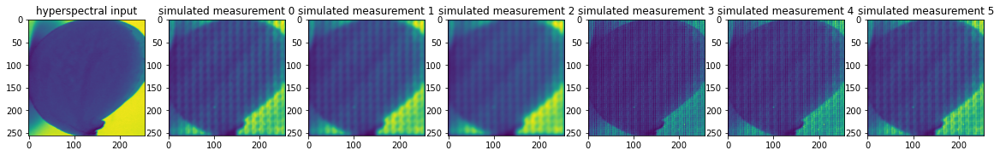

In [8]:
image_tensor1 = None
for i, sample in enumerate(train_dataloader): 
    if i == 0:
        image_tensor1 = sample['image']
    elif i == 1:
        image_tensor2 = sample['image']
        image_tensor = torch.stack((image_tensor1.to(device), image_tensor2.to(device)), dim = 1)[0]
        simulated_meas = forward_model(image_tensor.to(device))
        print('input shape:', image_tensor.shape, 'output shape:', simulated_meas.shape)

        image_np = (image_tensor[0].cpu().numpy()).transpose(1,2,0)
        fig, ax = plt.subplots(1,1 + num_inputs_simult, figsize = (20, 10))
        ax[0].imshow(np.mean(image_np,-1)); 
        ax[0].set_title('hyperspectral input')
        
        for j in range(0,num_inputs_simult):
            ax[1+j].imshow(np.mean(simulated_meas[0].detach().cpu().numpy()[j], 0))
            ax[1+j].set_title('simulated measurement '+ str(j))
        plt.show()
        break

In [9]:
#Train model
#1.) make save folder
args_dict = {'version': '3', 'number_measurements': str(num_inputs_simult),
        'blur_type': blur_type,
         'optimize_blur': str(optimize_blur)}
save_folder = 'saved_models/checkpoint_'+"_".join(list(args_dict.values())) + '/'

if not os.path.exists(save_folder):
    os.makedirs(save_folder)

#2.) define recon model 
recon_model = Unet3d.Unet(n_channel_in=num_inputs_simult, n_channel_out=1) #Unet or Unet3d.Unet
recon_model.to(device)
model = sm.MyEnsemble(forward_model.to(device), recon_model.to(device))
if optimize_blur == False:
    model.model1.w_blur.requires_grad = False

#3.) define loss parameters
from torch.nn import MSELoss, L1Loss, CosineSimilarity
from torch.optim import Adam
from torch.utils.data import DataLoader

loss_function = MSELoss() #CosineSimilarity() #L1Loss() 
optimizer = Adam(model.parameters(), lr=0.0001) #initially set to 0.001
        
print(model.model1.w_blur)
print(model.model1.w_blur.requires_grad)


Parameter containing:
tensor([0.0020, 0.0086, 0.0152, 0.0218, 0.0284, 0.0350], device='cuda:0')
False


In [10]:
#4.) Define pavia data as test data. 
pavia_dataloader = DataLoader(pavia_test_data, batch_size=1, shuffle=True)

def run_test():
    test_loss = 0
    sample_np = None
    for sample in pavia_dataloader:
        sample_np = sample['image'].numpy()[0]
        output = model(sample['image'].to(device))   # Compute the output image 
        loss = loss_function(output, sample['image'].to(device)) # Compute the loss
        test_loss += loss.item()
    test_loss = test_loss/pavia_dataloader.__len__()
    test_np = output.detach().cpu().numpy()[0]
        
    return test_loss, test_np, sample_np


training
Total Test Loss ( 0 ): 	 0.0057


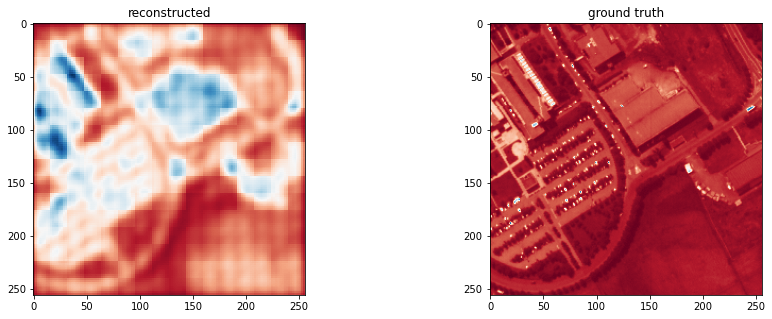

Total Train Loss ( 0 ): 0.0115  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


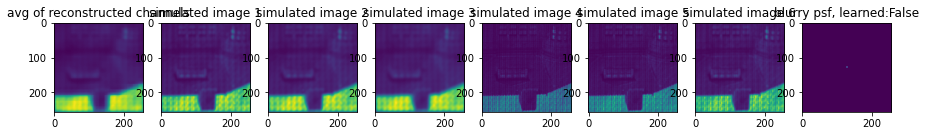

Total Train Loss ( 1 ): 0.0064  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


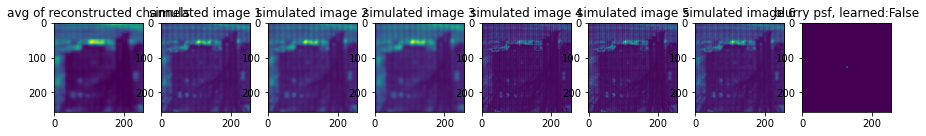

Total Train Loss ( 2 ): 0.0061  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


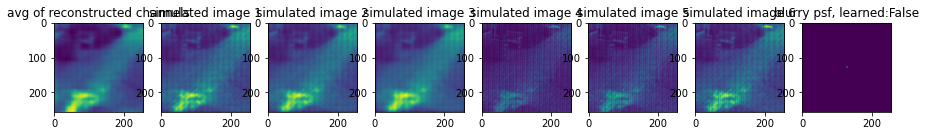

Total Train Loss ( 3 ): 0.0054  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


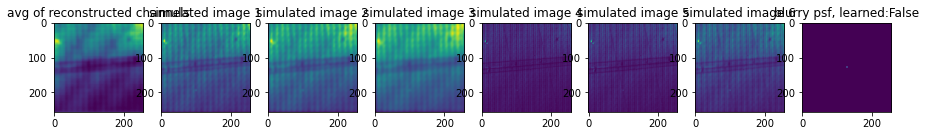

Total Train Loss ( 4 ): 0.005  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


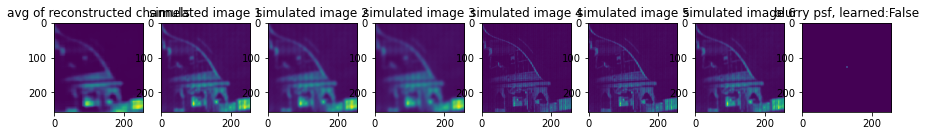

Total Train Loss ( 5 ): 0.0046  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


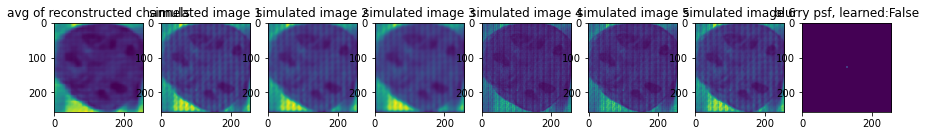

Total Train Loss ( 6 ): 0.0049  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


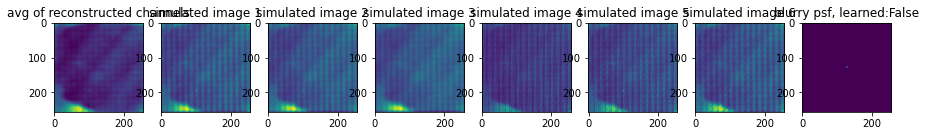

Total Train Loss ( 7 ): 0.0041  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


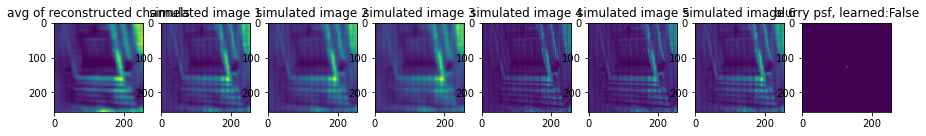

Total Train Loss ( 8 ): 0.0035  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


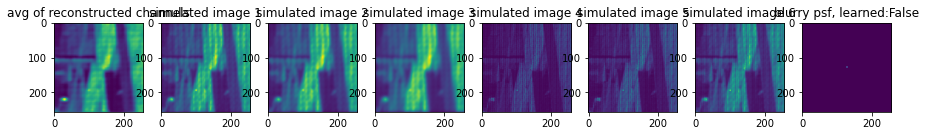

Total Train Loss ( 9 ): 0.0029  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


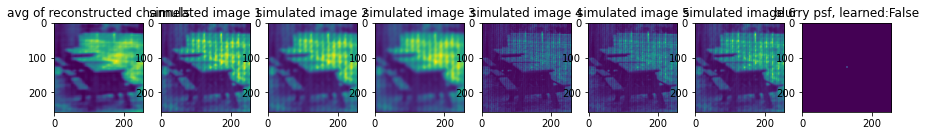

Total Test Loss ( 10 ): 	 0.003


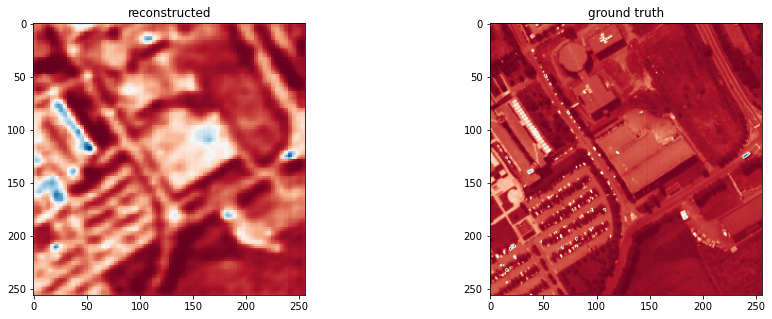

Total Train Loss ( 10 ): 0.0028  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


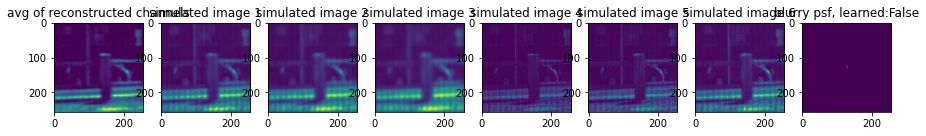

Total Train Loss ( 11 ): 0.0024  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


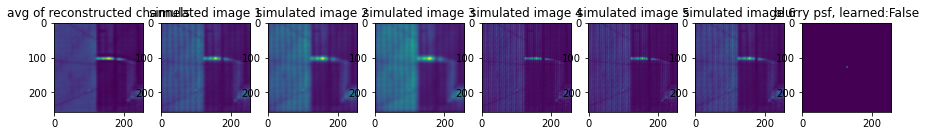

Total Train Loss ( 12 ): 0.0025  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


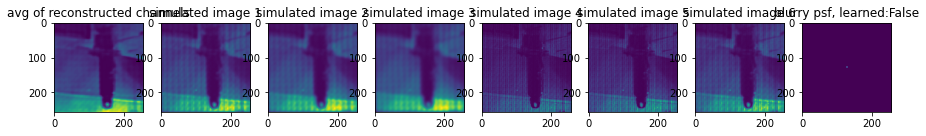

Total Train Loss ( 13 ): 0.0023  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


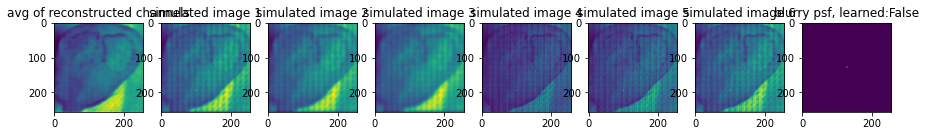

Total Train Loss ( 14 ): 0.0021  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


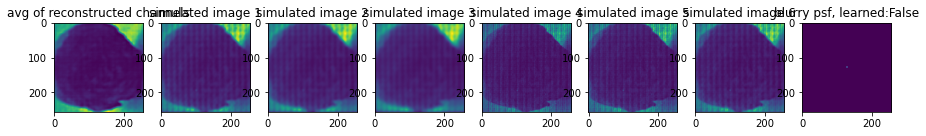

Total Train Loss ( 15 ): 0.002  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


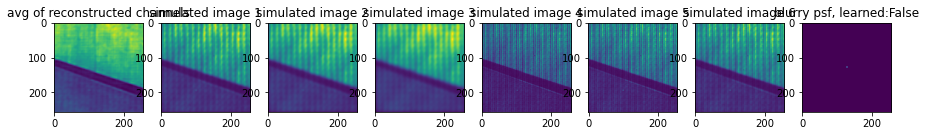

Total Train Loss ( 16 ): 0.0018  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


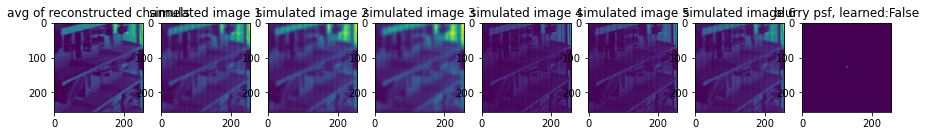

Total Train Loss ( 17 ): 0.0018  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


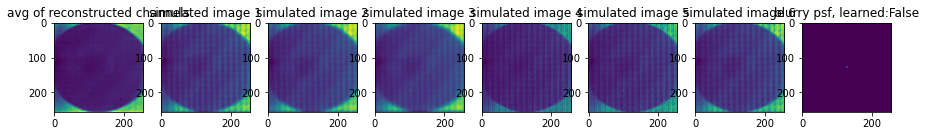

Total Train Loss ( 18 ): 0.0017  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


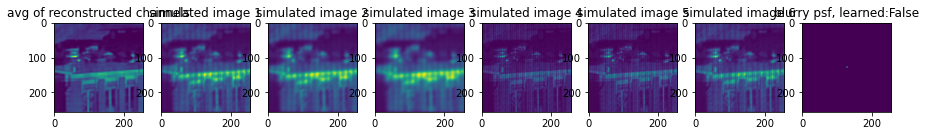

Total Train Loss ( 19 ): 0.0017  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


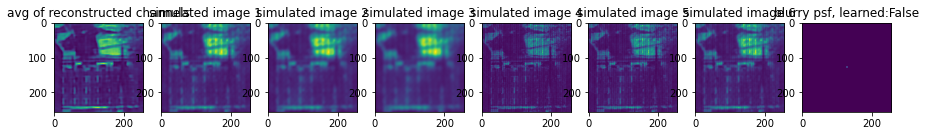

Total Test Loss ( 20 ): 	 0.0026


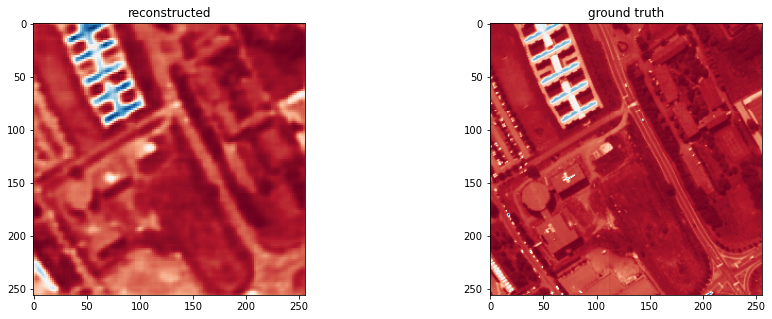

Total Train Loss ( 20 ): 0.0016  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


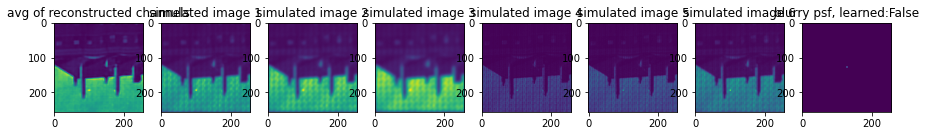

Total Train Loss ( 21 ): 0.0016  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


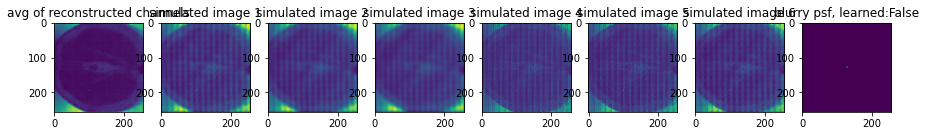

Total Train Loss ( 22 ): 0.0015  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


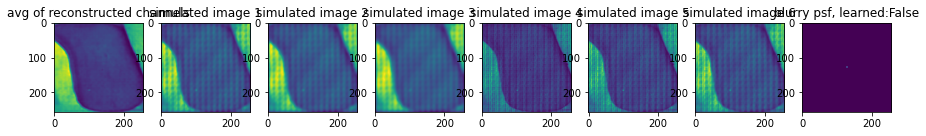

Total Train Loss ( 23 ): 0.0014  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


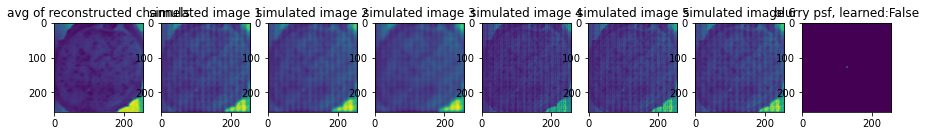

Total Train Loss ( 24 ): 0.0014  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


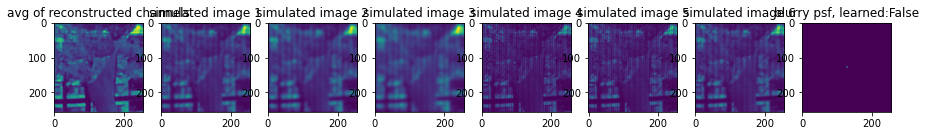

Total Train Loss ( 25 ): 0.0018  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


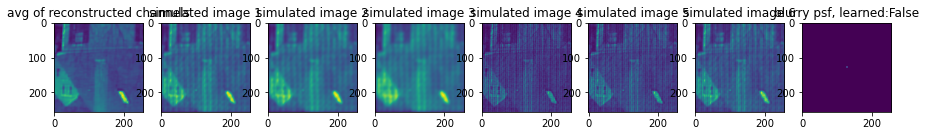

Total Train Loss ( 26 ): 0.0014  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


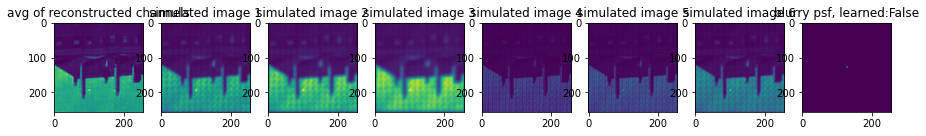

Total Train Loss ( 27 ): 0.0015  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


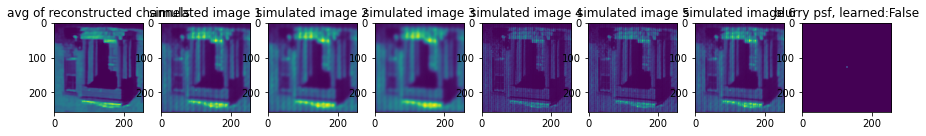

Total Train Loss ( 28 ): 0.0014  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


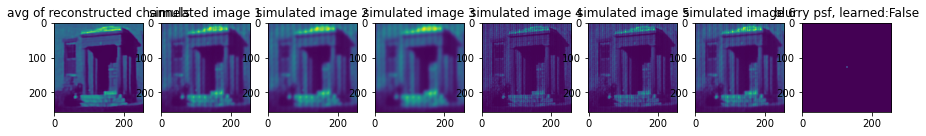

Total Train Loss ( 29 ): 0.0014  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


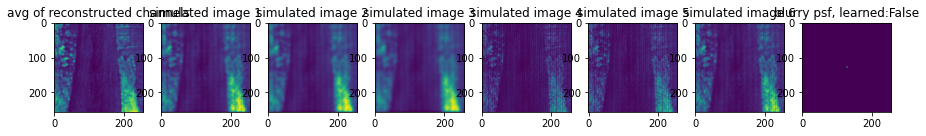

Total Test Loss ( 30 ): 	 0.0022


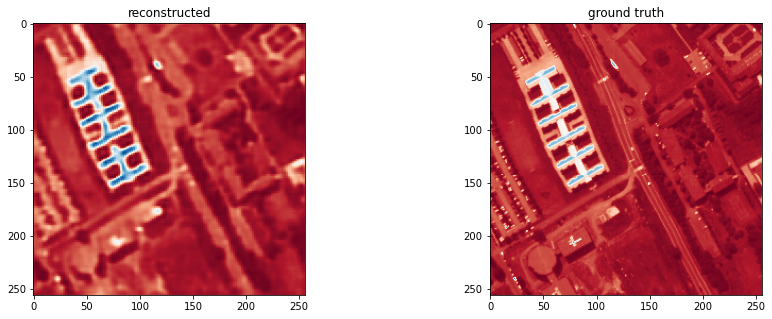

Total Train Loss ( 30 ): 0.0013  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


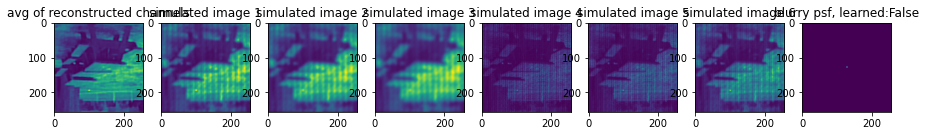

Total Train Loss ( 31 ): 0.0013  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


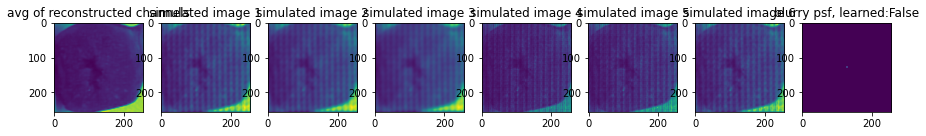

Total Train Loss ( 32 ): 0.0017  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


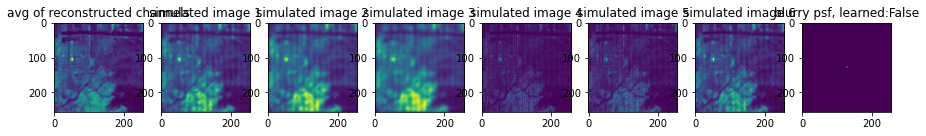

Total Train Loss ( 33 ): 0.0015  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


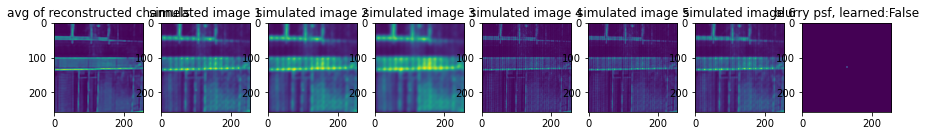

Total Train Loss ( 34 ): 0.0013  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


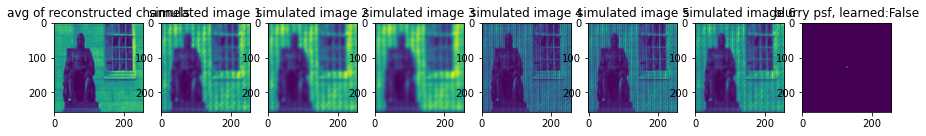

Total Train Loss ( 35 ): 0.0012  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


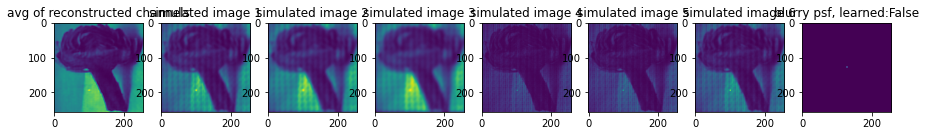

Total Train Loss ( 36 ): 0.0012  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


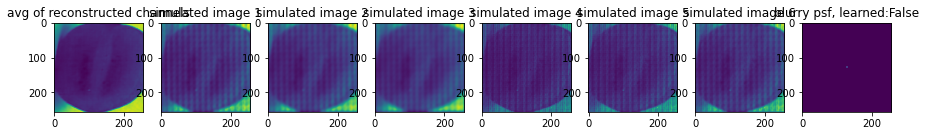

Total Train Loss ( 37 ): 0.0012  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


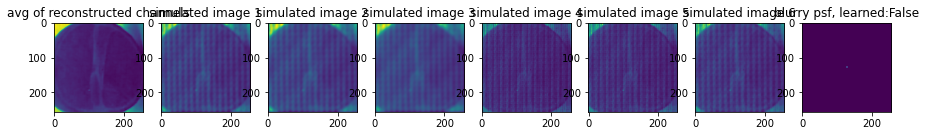

Total Train Loss ( 38 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


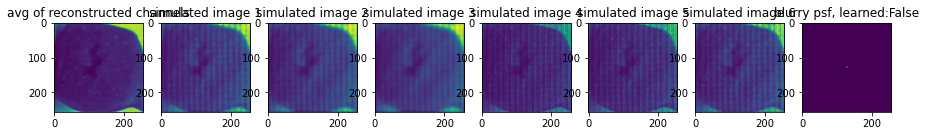

Total Train Loss ( 39 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


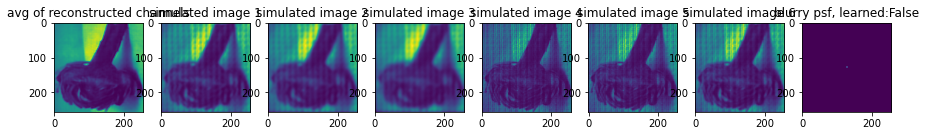

Total Test Loss ( 40 ): 	 0.0019


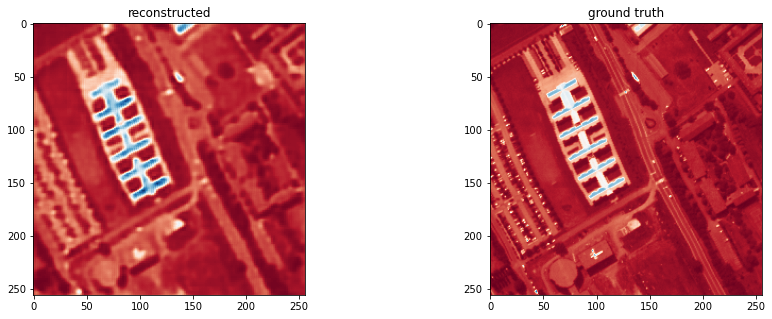

Total Train Loss ( 40 ): 0.0012  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


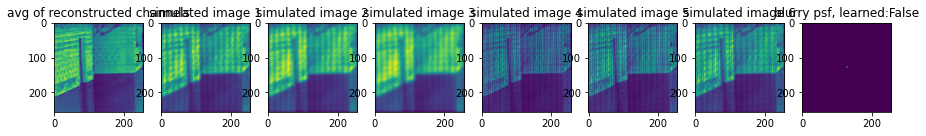

Total Train Loss ( 41 ): 0.0013  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


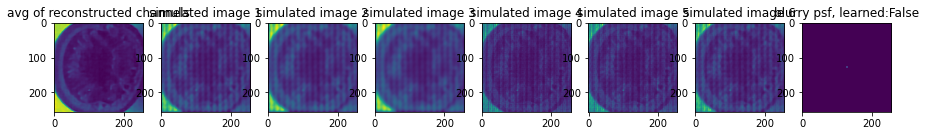

Total Train Loss ( 42 ): 0.0015  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


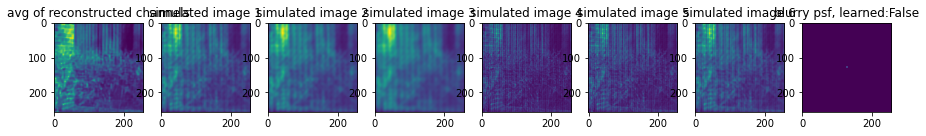

Total Train Loss ( 43 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


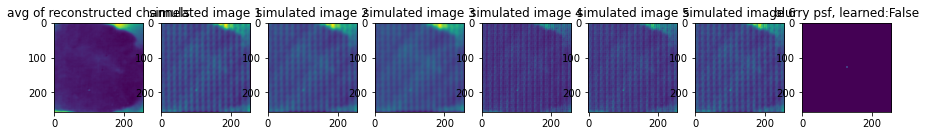

Total Train Loss ( 44 ): 0.0014  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


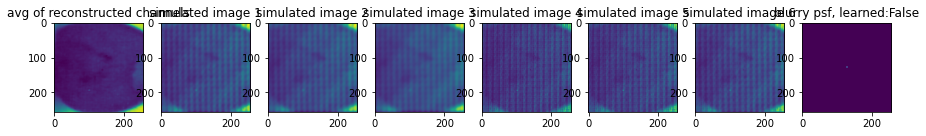

Total Train Loss ( 45 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


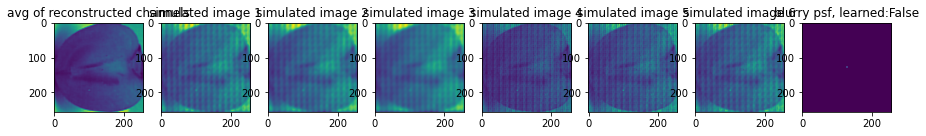

Total Train Loss ( 46 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


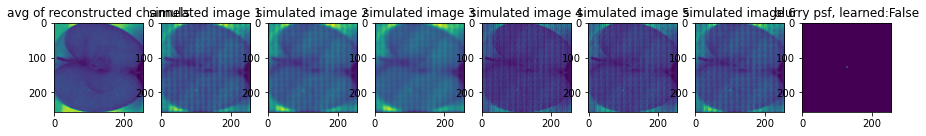

Total Train Loss ( 47 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


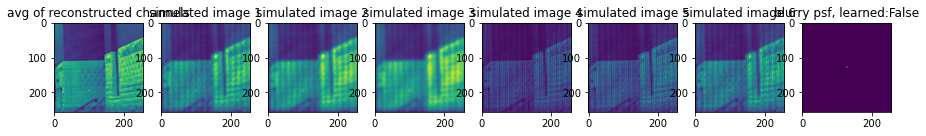

Total Train Loss ( 48 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


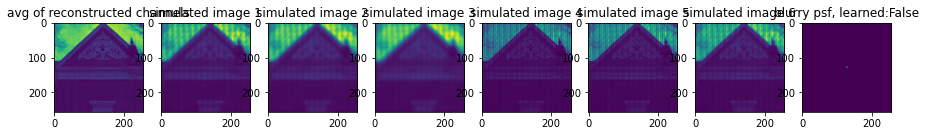

Total Train Loss ( 49 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


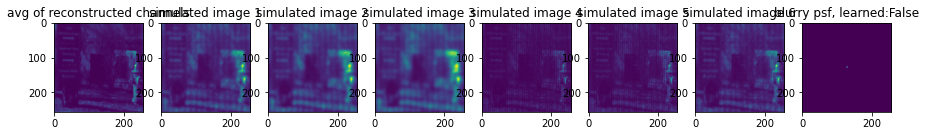

Total Test Loss ( 50 ): 	 0.0011


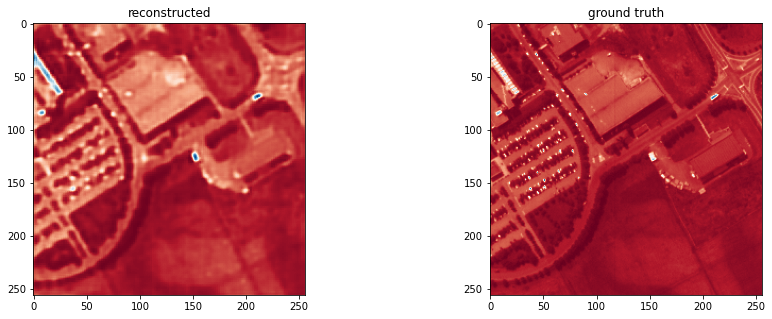

Total Train Loss ( 50 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


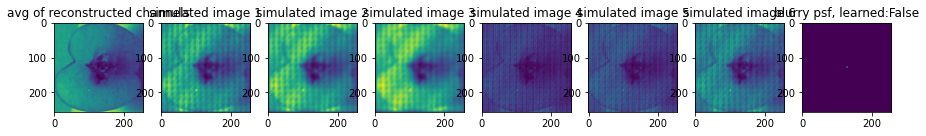

Total Train Loss ( 51 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


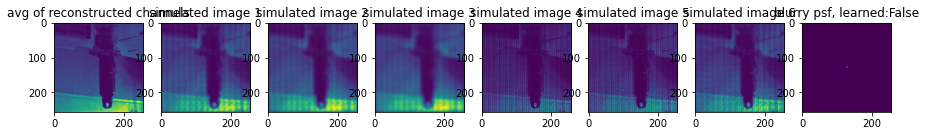

Total Train Loss ( 52 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


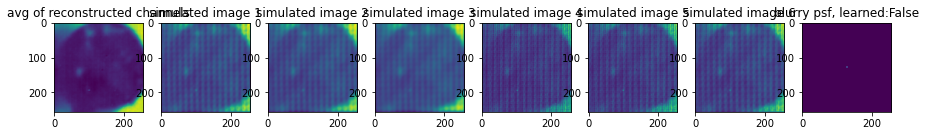

Total Train Loss ( 53 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


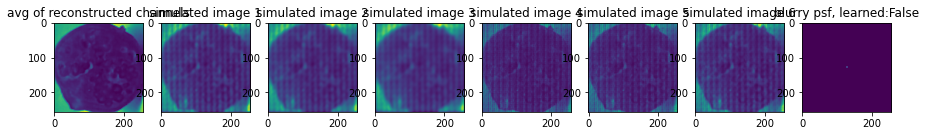

Total Train Loss ( 54 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


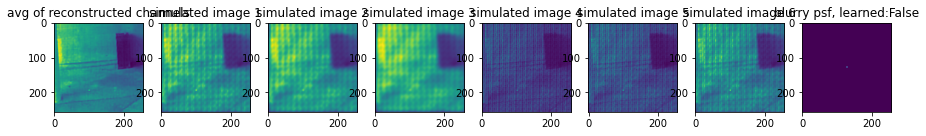

Total Train Loss ( 55 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


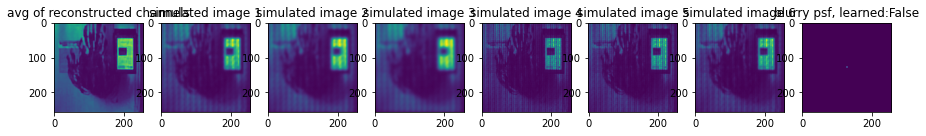

Total Train Loss ( 56 ): 0.0012  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


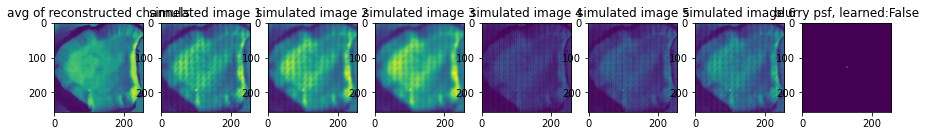

Total Train Loss ( 57 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


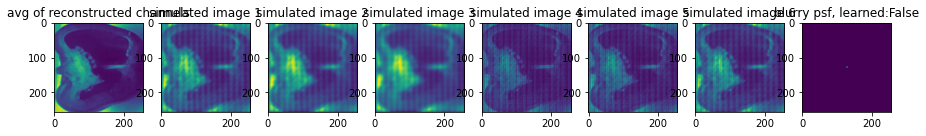

Total Train Loss ( 58 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


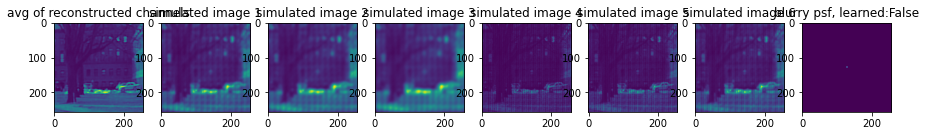

Total Train Loss ( 59 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


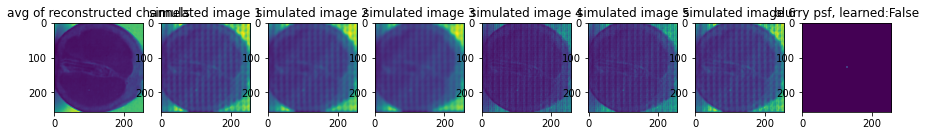

Total Test Loss ( 60 ): 	 0.0015


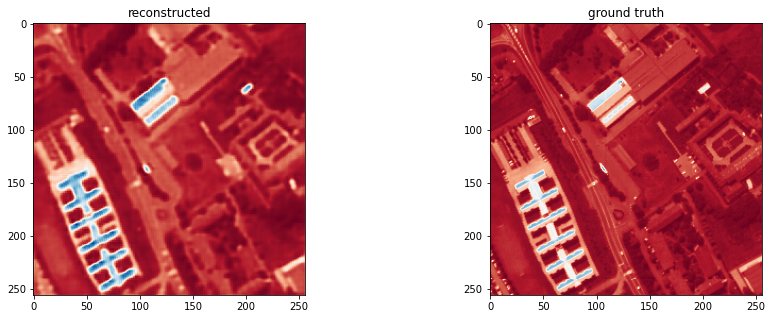

Total Train Loss ( 60 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


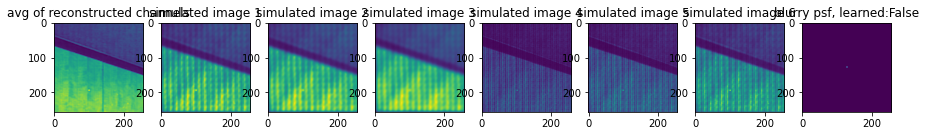

Total Train Loss ( 61 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


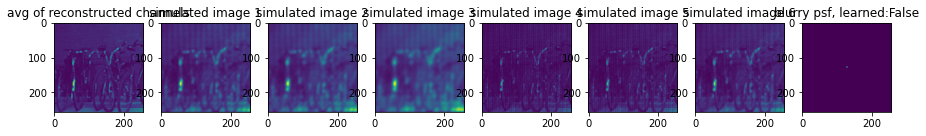

Total Train Loss ( 62 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


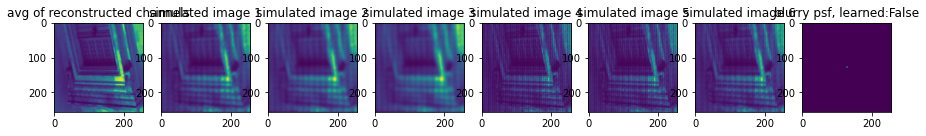

Total Train Loss ( 63 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


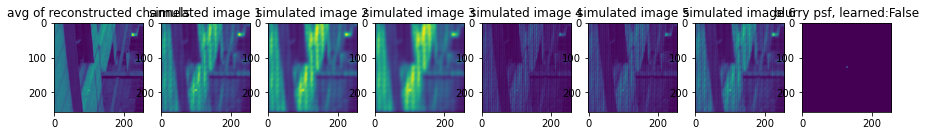

Total Train Loss ( 64 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


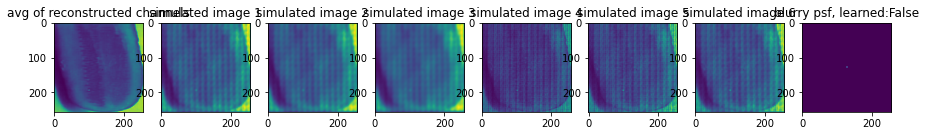

Total Train Loss ( 65 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


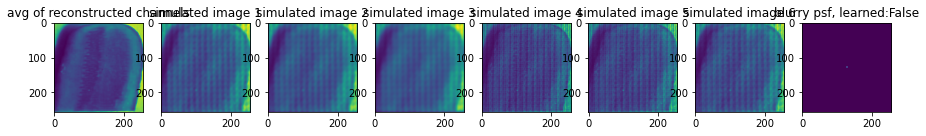

Total Train Loss ( 66 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


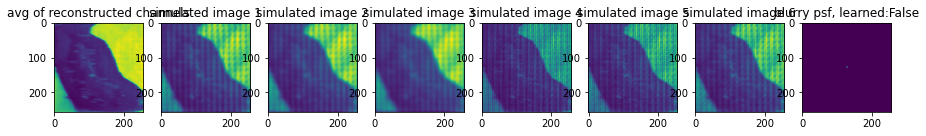

Total Train Loss ( 67 ): 0.0012  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


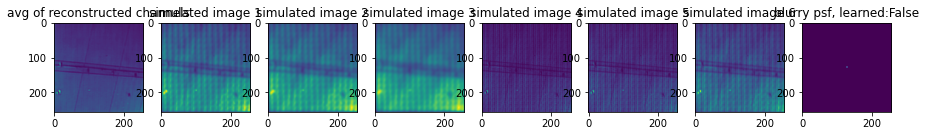

Total Train Loss ( 68 ): 0.0011  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


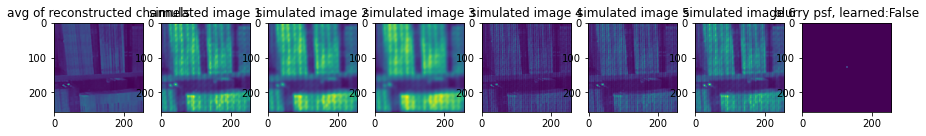

Total Train Loss ( 69 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


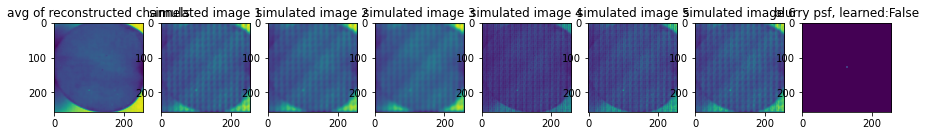

Total Test Loss ( 70 ): 	 0.0013


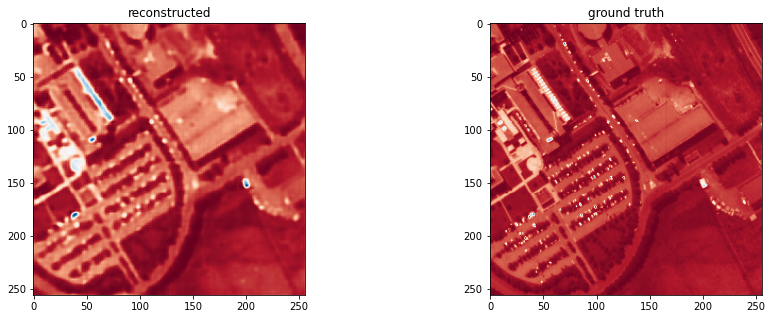

Total Train Loss ( 70 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


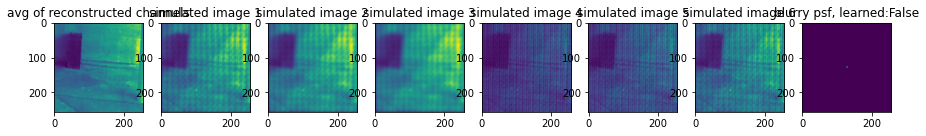

Total Train Loss ( 71 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


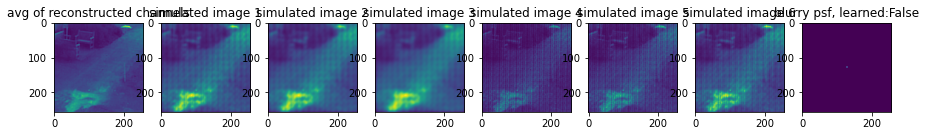

Total Train Loss ( 72 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


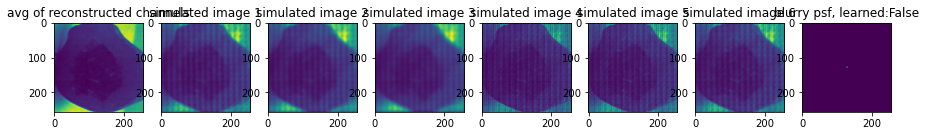

Total Train Loss ( 73 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


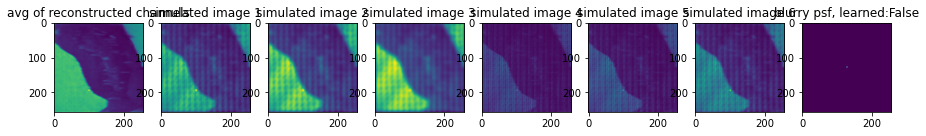

Total Train Loss ( 74 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


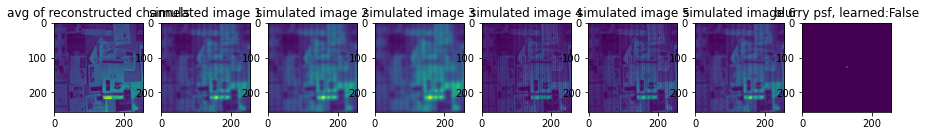

Total Train Loss ( 75 ): 0.001  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


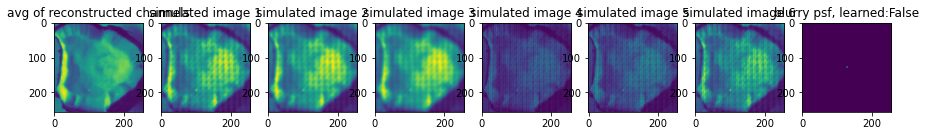

Total Train Loss ( 76 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


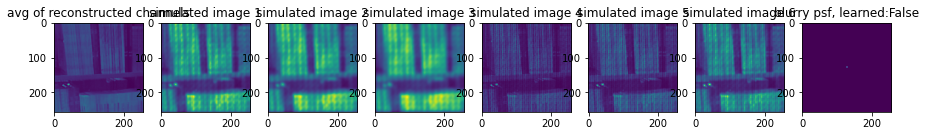

Total Train Loss ( 77 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


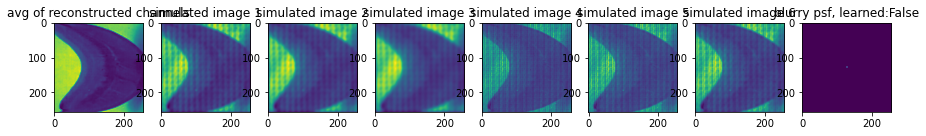

Total Train Loss ( 78 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


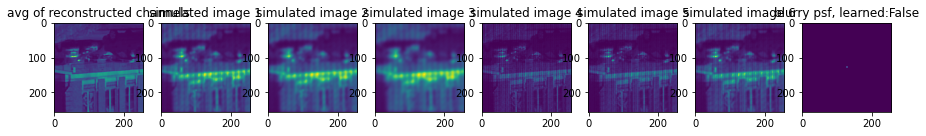

Total Train Loss ( 79 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


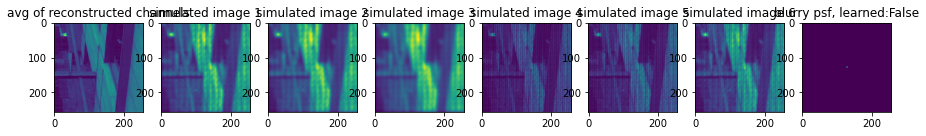

Total Test Loss ( 80 ): 	 0.0015


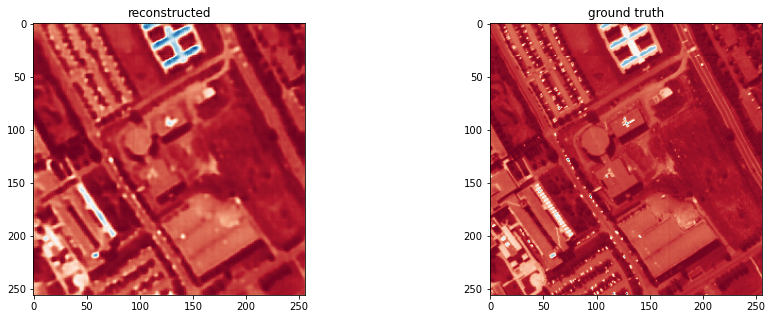

Total Train Loss ( 80 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


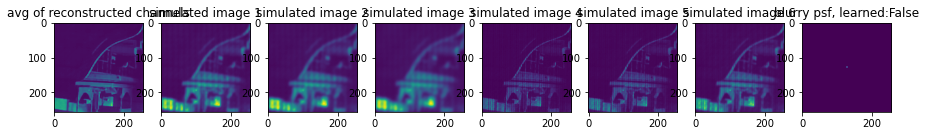

Total Train Loss ( 81 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


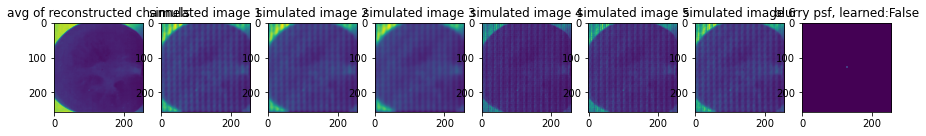

Total Train Loss ( 82 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


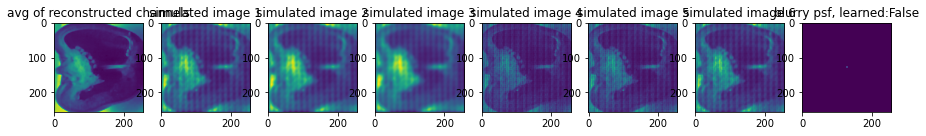

Total Train Loss ( 83 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


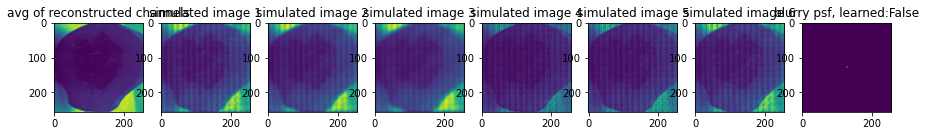

Total Train Loss ( 84 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


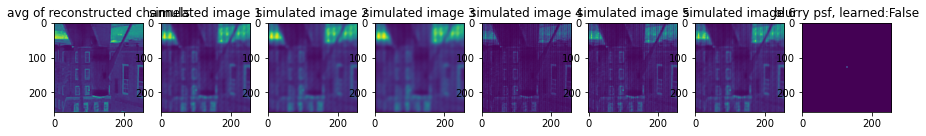

Total Train Loss ( 85 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


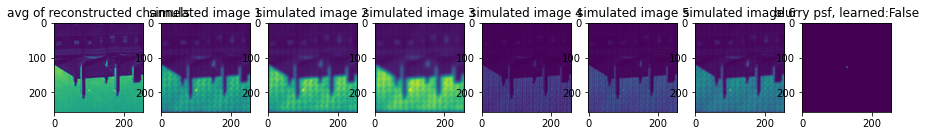

Total Train Loss ( 86 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


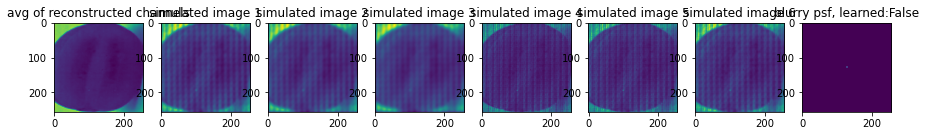

Total Train Loss ( 87 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


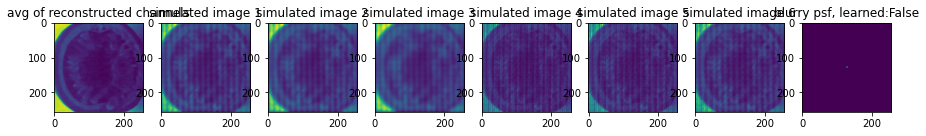

Total Train Loss ( 88 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


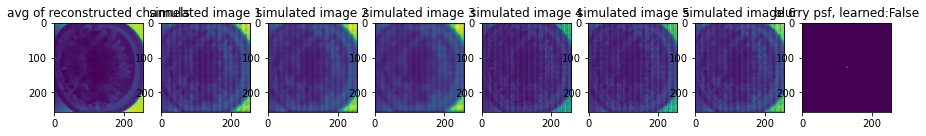

Total Train Loss ( 89 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


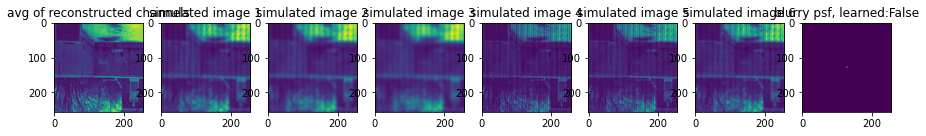

Total Test Loss ( 90 ): 	 0.0013


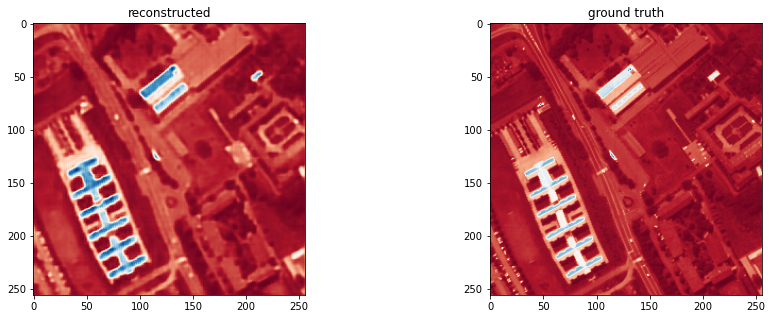

Total Train Loss ( 90 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


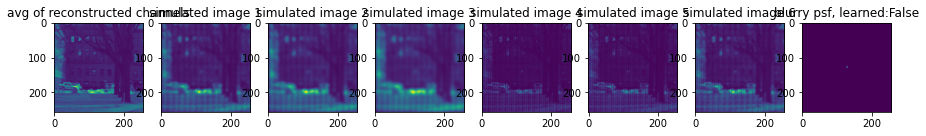

Total Train Loss ( 91 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


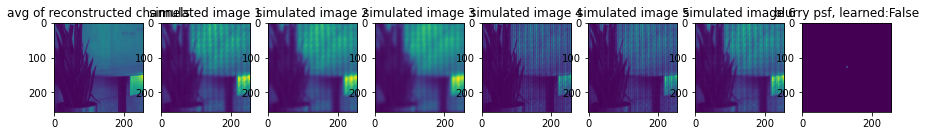

Total Train Loss ( 92 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


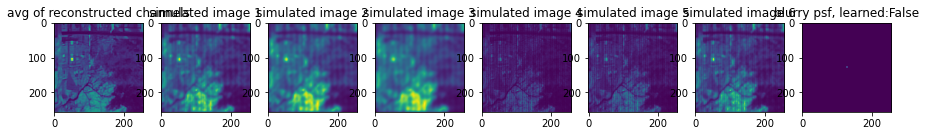

Total Train Loss ( 93 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


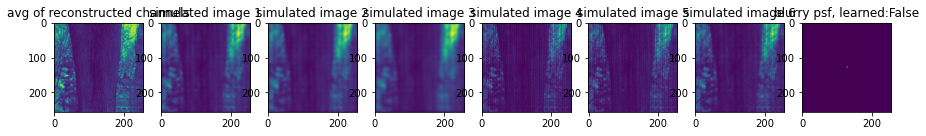

Total Train Loss ( 94 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


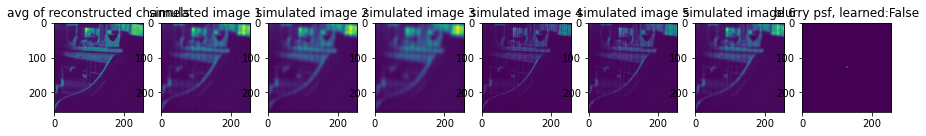

Total Train Loss ( 95 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


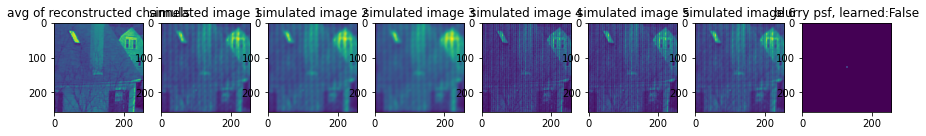

Total Train Loss ( 96 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


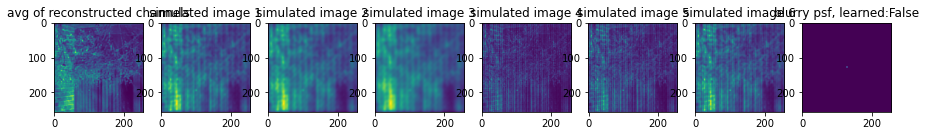

Total Train Loss ( 97 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


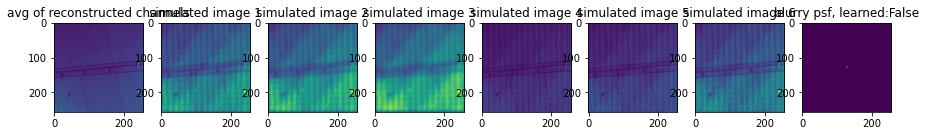

Total Train Loss ( 98 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


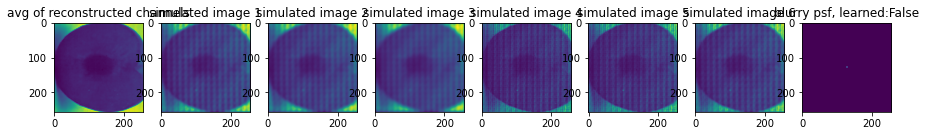

Total Train Loss ( 99 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


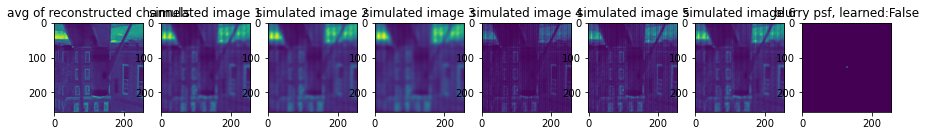

Total Test Loss ( 100 ): 	 0.0012


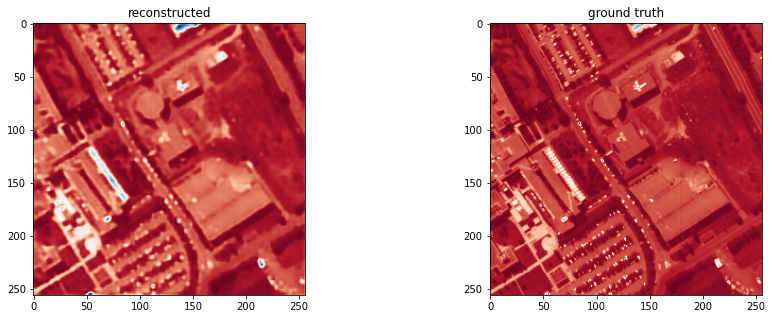

Total Train Loss ( 100 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


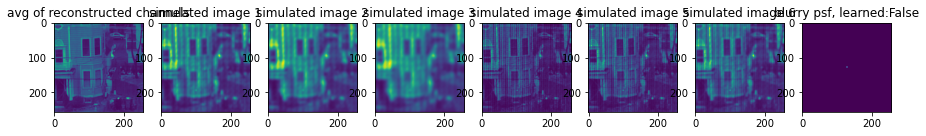

Total Train Loss ( 101 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


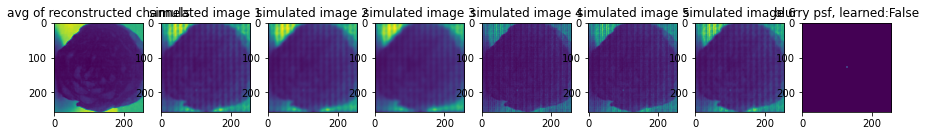

Total Train Loss ( 102 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


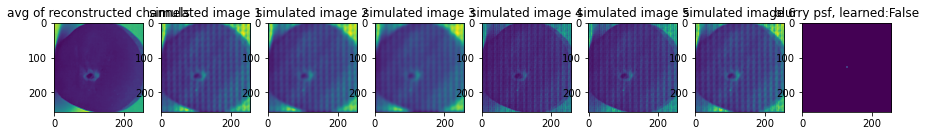

Total Train Loss ( 103 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


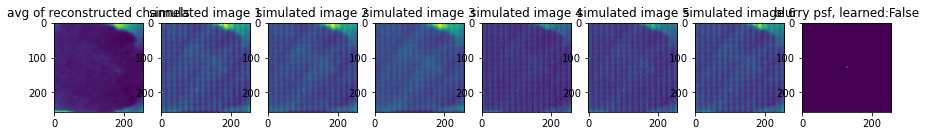

Total Train Loss ( 104 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


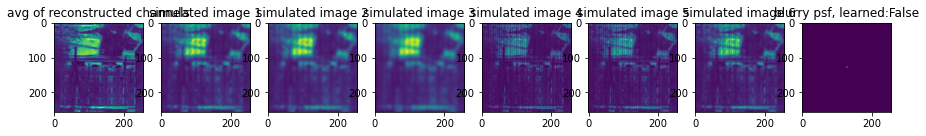

Total Train Loss ( 105 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


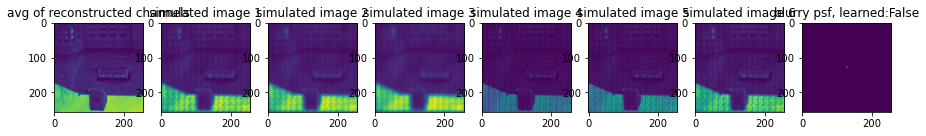

Total Train Loss ( 106 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


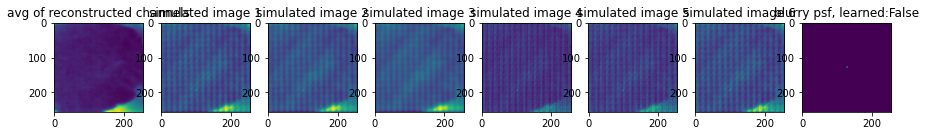

Total Train Loss ( 107 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


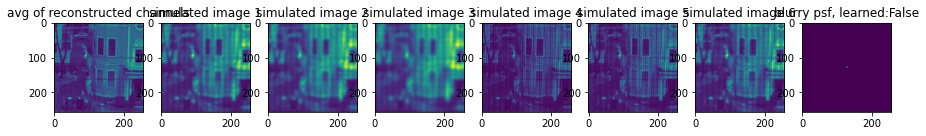

Total Train Loss ( 108 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


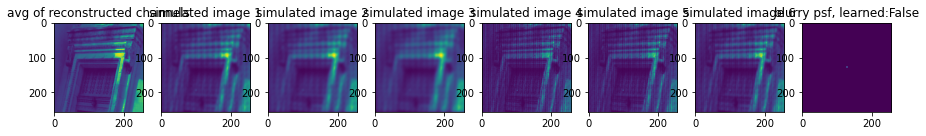

Total Train Loss ( 109 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


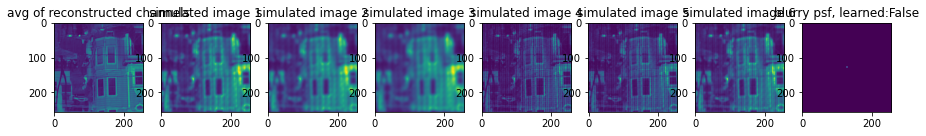

Total Test Loss ( 110 ): 	 0.0012


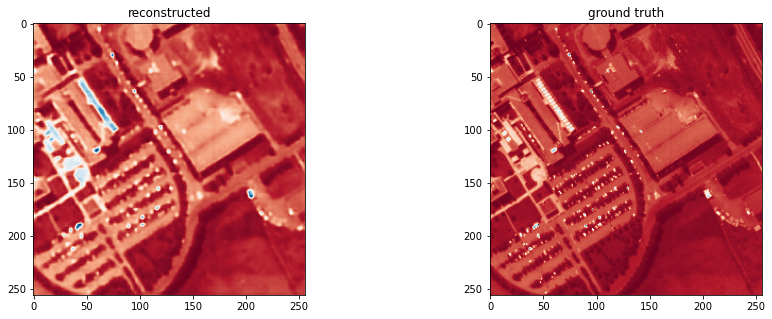

Total Train Loss ( 110 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


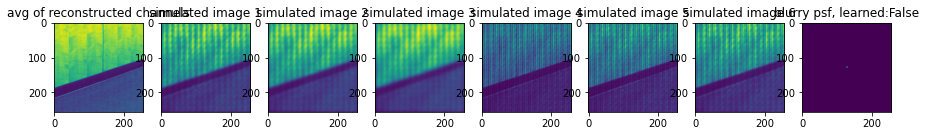

Total Train Loss ( 111 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


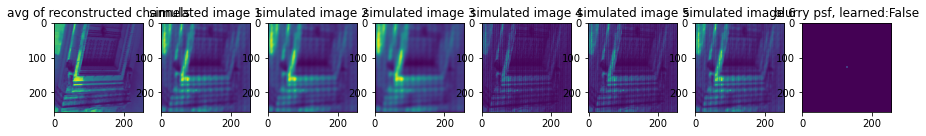

Total Train Loss ( 112 ): 0.0007  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


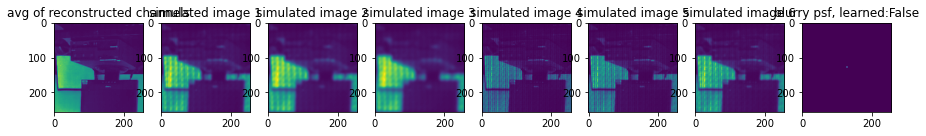

Total Train Loss ( 113 ): 0.0006  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


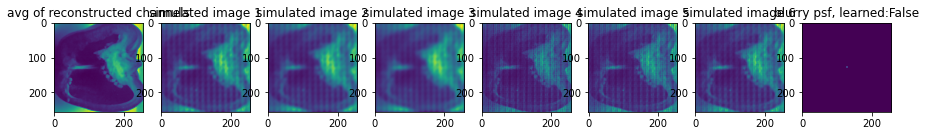

Total Train Loss ( 114 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


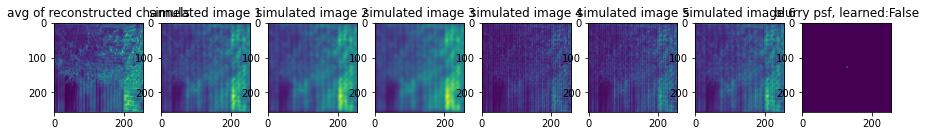

Total Train Loss ( 115 ): 0.0008  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


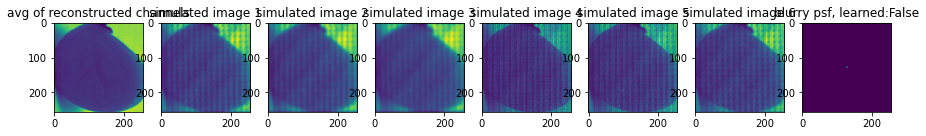

Total Train Loss ( 116 ): 0.0009  	 Blur ( symmetric ): [0.002  0.0086 0.0152 0.0218 0.0284 0.035 ]


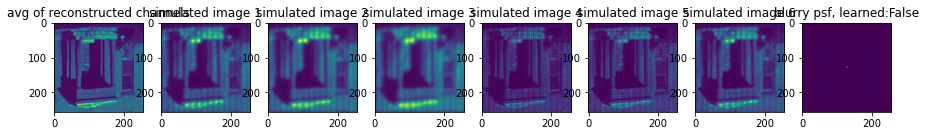

In [ ]:
epochs = 2000 
offset = 0
w_list = []
test_loss_list = []
train_loss_list = []
print('training')

for i in range(epochs): # Outerloop with epochs
    train_loss = 0
    
    for sample in train_dataloader:   # Training Loop (go through each image in the training set)
        output = model(sample['image'].to(device))   # Compute the output image 
        ground_padded = model.spectral_pad(sample['image'].to(device), spec_dim = 2, size = 2)
        loss = loss_function(output, sample['image'].to(device)) # Compute the loss
        train_loss += loss.item()
        
        # Update the model based on the loss
        optimizer.zero_grad() 
        loss.backward()  
        optimizer.step() 
        
        # Enforce a physical constraint on the parameters 
        model.model1.w_blur.data = torch.clip(model.model1.w_blur.data, .0006, 1)
        
        net_output_np = output.detach().cpu().numpy()[0]
        sim_meas_np = model.output1.detach().cpu().numpy()[0]
        
        #break 
    
    train_loss_list.append(train_loss/train_data.__len__())
    
    #testing
    test_loss = 0
    if i % 10 == 0:# and not i == 0:
        test_loss, test_np, ground_truth_np = run_test()
        test_loss_list.append(test_loss)
        
        #show test recon next to ground truth
        print("Total Test Loss (", i, "): \t", round(test_loss_list[-1], 4))
        fig,ax = plt.subplots(1,2,figsize = (15,5))
        ax[0].imshow(np.mean(test_np, 0), cmap = 'RdBu')
        ax[0].set_title('reconstructed')
        ax[1].imshow(np.mean(ground_truth_np,0), cmap = 'RdBu')
        ax[1].set_title('ground truth')
        
        plt.show()
        torch.save(model.state_dict(), save_folder + 'saved_model_' 'ep'+str(i)+'_testloss_'+str(test_loss) + '.pt')
        scipy.io.savemat(save_folder+'saved_lists.mat', 
                         {'test_loss': test_loss_list,
                         'train_loss': train_loss_list,
                         'w_list': w_list})
    test_loss_list.append(test_loss)
        
    #show train recon next to masks
    print("Total Train Loss (", i, "):", round(train_loss_list[-1], 4),
         " \t Blur (",model.model1.blur_type ,"):", model.model1.w_blur.data.detach().cpu().numpy())
    fig, ax = plt.subplots(1,num_inputs_simult+2, figsize = (15,5))
    ax[0].imshow(np.mean(net_output_np,0)) #np.mean(a,0) averages spec channels
    ax[0].set_title('avg of reconstructed channels')
    for j in range(0,num_inputs_simult):
        ax[j+1].imshow(np.mean(sim_meas_np[j],0))
        ax[j+1].set_title(f'simulated image {j+1}')
    ax[-1].imshow(model.model1.psfs[1].detach().cpu().numpy()) #blurry psf
    ax[-1].set_title(f'blurry psf, learned:{optimize_blur}')
    plt.show()
    
    #save model state
    torch.save(model.state_dict(), save_folder + 'saved_model_' 'ep'+str(i + offset)+'_testloss_'+str(test_loss) + '.pt')
    scipy.io.savemat(save_folder+'saved_lists.mat', 
                     {'test_loss': test_loss_list,
                     'train_loss': train_loss_list,
                     'w_list': w_list})

In [12]:
checkpoint = 'saved_models/checkpoint_3_4_symmetric_False/saved_model_ep240_testloss_0.0006673465250059962.pt'
model.load_state_dict(torch.load(checkpoint))

<All keys matched successfully>

In [18]:
1=1=1
#best_trained = "/home/cfoley_waller/10tb_extension/defocam/saved_models/saved_models/checkpoint_2_symmetric_False/saved_model_ep1590_testloss_0.02054610289633274.pt"
best_trained_3 ="/home/cfoley_waller/defocam/SpectralDefocusCam/saved_models/optimal_models/saved_model_ep870_3_testloss_0.0004674650845117867.pt"
model.load_state_dict(torch.load(best_trained_3))


<All keys matched successfully>

In [1]:
1=1=1
recon = None
ground = None
for i, sample in enumerate(train_dataloader): 
    if i == 0:
        image_tensor1 = sample['image']
    elif i >= 1:
        image_tensor2 = sample['image']
        
        start_time = time.time()
        output = model(image_tensor2.to(device))
        print('time taken to compute 2: ', time.time()-start_time, ' seconds')
        
        fig, ax = plt.subplots(1, 2, figsize = (20,10))
        ax[0].imshow(np.mean(image_tensor2.numpy()[0], 0))
        ax[0].set_title('ground truth')
        ax[1].imshow(np.mean(output.detach().cpu().numpy()[0], 0))
        ax[1].set_title(f'simulated with 3 levels of blur -- Loss : {loss_function(output3[0], image_tensor2[0].to(device)).item()}')
        plt.show()
        if i == 10:
            break

SyntaxError: cannot assign to literal (<ipython-input-1-7fc6c798fc79>, line 1)

In [ ]:
"""BELOW: USEFUL BUT UNUSED/BROKEN CODE"""

In [ ]:
#MSE definition
def cal_mse(im1, im2):
    im1 = im1/np.linalg.norm(im1)
    im2 = im2/np.linalg.norm(im2)
    return np.sum(np.abs(im1 -im2)**2)

In [ ]:
#lowest loss (i think?) model directory
best_trained ="/home/cfoley_waller/defocam/SpectralDefocusCam/saved_models/checkpoint_3_2_symmetric_False/saved_model_ep811_testloss_0.0009659797069616616.pt"
model.load_state_dict(torch.load(best_trained))

In [ ]:
#loss comparison code
with open('/home/cfoley_waller/DiffuserForPresentation/SpectralDefocusCam/paper_results/natural_fence_ground.npy', 'rb') as f:
    samp = np.load(f)
samp_tensor = tt(samp.transpose(2,1,0)).unsqueeze(0)
samp_model = model(samp_tensor)

loss = cal_mse(samp_model.cpu().detach().numpy(), samp_tensor.cpu().detach().numpy())
rotated = np.rot90(samp_model[0].cpu().detach().numpy().transpose(1,2,0), k = 3)

k = 30
plt.imshow(np.fliplr(helper.stack_rgb_opt(rotated, 
                                scaling = [0.48*k,0.827*k,2.02*k])))

In [ ]:
#loss comparison code
with open('/home/cfoley_waller/DiffuserForPresentation/SpectralDefocusCam/paper_results/natural_fence_comb_fista.npy', 'rb') as f:
    comb = tt(np.load(f))
with open('/home/cfoley_waller/DiffuserForPresentation/SpectralDefocusCam/paper_results/natural_fence_diffuser_fista.npy', 'rb') as f:
    diffuser = tt(np.load(f))
ground = tt(samp)
loss1 = loss_function(diffuser, ground)
loss2 = loss_function(comb, ground)
print(loss1, loss2)

In [ ]:
#wavelengths array.
wavs = np.array([378, 386, 394, 402, 410, 418, 426, 434, 442, 450, 458, 466, 474,
       482, 490, 498, 506, 514, 522, 530, 538, 546, 554, 562, 570, 578,
       586, 594, 602, 610, 618, 626, 634, 642, 650, 658, 666, 674, 682,
       690, 698, 714, 722, 730, 738, 746, 754, 762, 770, 778, 786, 794,
       802, 810, 818, 826, 834, 842, 850, 858, 866, 874, 882, 890, 898])
print(wavs.shape)
wavs = np.array([wavs[i] for i in range(0,64) if i%2 == 0])[1:-1]

In [ ]:
#more broken 3d plotting code
fruit_dataloader2 = DataLoader(fruit_train_data, batch_size = 1, shuffle = False)
items = [sample['image'] for i, sample in enumerate(fruit_dataloader2) if i < 2]

helper.plt3D(helper.pre_plot(items[0][0].cpu().detach().numpy().transpose(1,2,0)))
plt.imshow(helper.stack_rgb_opt(items[0][0].cpu().detach().numpy().transpose(1,2,0), scaling = [0.48,0.827,2.02]))

In [ ]:
#checkpoint setting code. the directory path is important.
latest_checkpoint ="/home/cfoley_waller/defocam/SpectralDefocusCam/saved_models/optimal_models/saved_model_ep731_testloss_0.000792170874774456.pt"
model.load_state_dict(torch.load(latest_checkpoint))
offset = 731

In [ ]:
#3d visualization of data cube. Helper.pre_plot is broken with changes for ML (fix later)
loss, test_np, ground_truth_np = run_test()
print(len(test_np))
helper.plt3D(helper.pre_plot(test_np[-1])) "*broken*"

In [ ]:
#old training code
for i in range(epochs):
    train_loss = 0
    k = 0
    
    post_forward_np_list = []
    post_recon_np_list = []
    
    for sample in fruit_dataloader:
        k += 1
        optimizer.zero_grad() #doing this first to initialize gradients to 0
        
        base = sample['image'].to(device)
        output = model(base)
        
        base_padded = model.spectral_pad(base, 1)
        output = output[0]
        loss = loss_function(output, base_padded)
        train_loss += loss.item()

        loss.backward()
        
        #NaN gradients can be detected -> set to 0
        optimizer.step()
        
        model.model1.w_blur.data = torch.clip(model.model1.w_blur.data, .0006, 1)
        #we can enforce a constraint... but right now it is just stopping at this edge ^

        post_forward_np_list.append(model.output1.detach().cpu().numpy()[0])
        post_recon_np_list.append(output.detach().cpu().numpy()[0])
        
    
    loss_per_sample = train_loss / fruit_dataloader.__len__()
    loss_list.append(loss_per_sample)
    
    #testing
    test_loss = 0
    if i % 10 == 0 and not i == 0:
        test_loss, test_np, ground_truth_np = run_test()
        test_loss_list.append(test_loss)
        
        #show test recon next to ground truth
        print("Total Test Loss (", i, "): \t", round(test_loss_list[-1], 4))
        fig,ax = plt.subplots(1,2,figsize = (15,5))
        ax[0].imshow(np.mean(test_np, 0), cmap = 'RdBu')
        ax[0].set_title('reconstructed')
        ax[1].imshow(np.mean(ground_truth_np,0), cmap = 'RdBu')
        ax[1].set_title('ground truth')
        
        plt.show()
        
        
    #show train recon next to masks
    print("Total Train Loss (", i, "):", round(loss_list[-1], 4),
         " \t Blur:", model.model1.w_blur.data.detach().cpu().numpy())
    fig, ax = plt.subplots(1,num_inputs_simult+2, figsize = (15,5))
    ax[0].imshow(np.mean(post_recon_np_list[-1],0)) #np.mean(a,0) averages spec channels
    ax[0].set_title('avg of reconstructed channels')
    for j in range(0,num_inputs_simult):
        ax[j+1].imshow(np.mean(post_forward_np_list[-1][j],0))
        ax[j+1].set_title(f'simulated image {j+1}')
    ax[-1].imshow(model.model1.psf[1]) #blurry psf
    ax[-1].set_title(f'blurry psf, learned:{optimize_blur}')
    plt.show()
    
    
torch.save(model.state_dict(), save_folder + 'saved_model_' 'ep'+str(i)+'_testloss_'+str(test_loss) + '.pt')
scipy.io.savemat(save_folder+'saved_lists.mat', 
                 {'test_loss': test_loss_list,
                 'train_loss': loss_list,
                 'w_list': w_list})
    
          